# Energy & Force Evaluation

Analysis notebook matching the outputs of `train.py`:
- `initial_evaluations.parquet` — before training
- `final_evaluations.parquet` — after training
- `loss_history.parquet` — per-epoch loss
- `metrics.parquet` — summary metrics

In [1]:
%matplotlib inline

import json
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score
from scipy.stats import pearsonr, kendalltau

sns.set(style="whitegrid", font_scale=1.2)

In [2]:
# ---- Point these to the correct directories ----
OUTPUT_DIR  = "/scratch1/joao/joao_vol/train_experiments/ash_charges_LAST/train_output"
DATASET_DIR = "/scratch1/joao/joao_vol/aggregated_datasets/dataset_200_stride_2_arrow_mace_polar"

# Evaluation parquets produced by train.py
df_initial = pd.read_parquet(f"{OUTPUT_DIR}/initial_evaluations.parquet")
df_final   = pd.read_parquet(f"{OUTPUT_DIR}/final_evaluations.parquet")

# Loss history and summary metrics
df_loss    = pd.read_parquet(f"{OUTPUT_DIR}/loss_history.parquet")
df_metrics = pd.read_parquet(f"{OUTPUT_DIR}/metrics.parquet")

# Build mixture_id -> component display title from meta JSON
with open(f"{DATASET_DIR}/combined_dataset_meta.json") as _f:
    _meta = json.load(_f)

mixture_title_map = {}
for _run in _meta["runs"]:
    _comps = _run["components"]
    _parts = [f"{c['smiles']} ({c.get('mole_fraction', 1.0):.2f})" for c in _comps]
    mixture_title_map[_run["name"]] = "\n".join(_parts)

print("Initial evaluations:", df_initial.shape)
print("Final evaluations  :", df_final.shape)
print("Loss history       :", df_loss.shape)
print(f"\nLoaded titles for {len(mixture_title_map)} mixtures.")

if "scale_factor" in df_initial.columns:
    print(f"scale_factor column present — {df_initial['scale_factor'].nunique()} unique values.")
else:
    print("WARNING: scale_factor column missing. Re-run train.py to populate it.")

print("\nMetrics:")
df_metrics

Initial evaluations: (2570, 8)
Final evaluations  : (2570, 8)
Loss history       : (500, 1)

Loaded titles for 202 mixtures.
scale_factor column present — 13 unique values.

Metrics:


,stage,energy_mae,energy_rmse,energy_r2,forces_mae,forces_rmse,forces_r2
0,pre_perturbation,1.620704,4.293552,0.157642,11.952018,17.876767,-0.066302
1,perturbed,1.620704,4.293552,0.157642,11.952018,17.876767,-0.066302
2,final,0.417287,0.654385,0.980433,11.693561,17.309131,0.000339


In [3]:
def compute_metrics(y_true, y_pred):
    """Compute regression metrics between true and predicted values."""
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = np.mean(np.abs(y_true - y_pred))
    bias = np.mean(y_pred - y_true)
    r2 = r2_score(y_true, y_pred)
    rho, _ = pearsonr(y_true, y_pred)
    tau, _ = kendalltau(y_true, y_pred)
    return {"RMSE": rmse, "MAE": mae, "Bias": bias, "R\u00b2": r2, "Pearson \u03c1": rho, "Kendall \u03c4": tau}


def plot_scatter(y_true, y_pred, xlabel, ylabel, title=None):
    """Create a scatter plot of predicted vs reference with a metrics text box."""
    metrics = compute_metrics(y_true, y_pred)

    fig, ax = plt.subplots(figsize=(5.5, 5))

    vmin = min(y_true.min(), y_pred.min())
    vmax = max(y_true.max(), y_pred.max())
    pad = 0.05 * (vmax - vmin)

    ax.plot([vmin - pad, vmax + pad], [vmin - pad, vmax + pad], "--", color="black", lw=1, zorder=1)
    ax.scatter(y_true, y_pred, marker="o", s=18, alpha=0.65, edgecolors="white", linewidths=0.3, zorder=2)

    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_xlim(vmin - pad, vmax + pad)
    ax.set_ylim(vmin - pad, vmax + pad)
    ax.set_aspect("equal")
    if title:
        ax.set_title(title)

    text = "\n".join(f"{k} = {v:.3f}" for k, v in metrics.items())
    ax.text(0.04, 0.96, text, transform=ax.transAxes,
            verticalalignment="top", bbox=dict(boxstyle="round,pad=0.4", facecolor="white", alpha=0.5))

    fig.tight_layout()
    plt.show()


def plot_scatter_side_by_side(df_a, df_b, col_ref, col_pred, xlabel, ylabel, title_a="Initial", title_b="Final"):
    """Side-by-side scatter plots comparing two stages."""
    fig, axes = plt.subplots(1, 2, figsize=(11, 5))

    for ax, df, title in zip(axes, [df_a, df_b], [title_a, title_b]):
        y_true = df[col_ref].values
        y_pred = df[col_pred].values
        metrics = compute_metrics(y_true, y_pred)

        vmin = min(y_true.min(), y_pred.min())
        vmax = max(y_true.max(), y_pred.max())
        pad = 0.05 * (vmax - vmin)

        ax.plot([vmin - pad, vmax + pad], [vmin - pad, vmax + pad], "--", color="black", lw=1, zorder=1)
        ax.scatter(y_true, y_pred, marker="o", s=18, alpha=0.65, edgecolors="white", linewidths=0.3, zorder=2)

        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.set_xlim(vmin - pad, vmax + pad)
        ax.set_ylim(vmin - pad, vmax + pad)
        ax.set_aspect("equal")
        ax.set_title(title)

        text = "\n".join(f"{k} = {v:.3f}" for k, v in metrics.items())
        ax.text(0.04, 0.96, text, transform=ax.transAxes,
                verticalalignment="top", bbox=dict(boxstyle="round,pad=0.4", facecolor="white", alpha=0.5))

    fig.tight_layout()
    plt.show()

## Energy: Initial vs Final

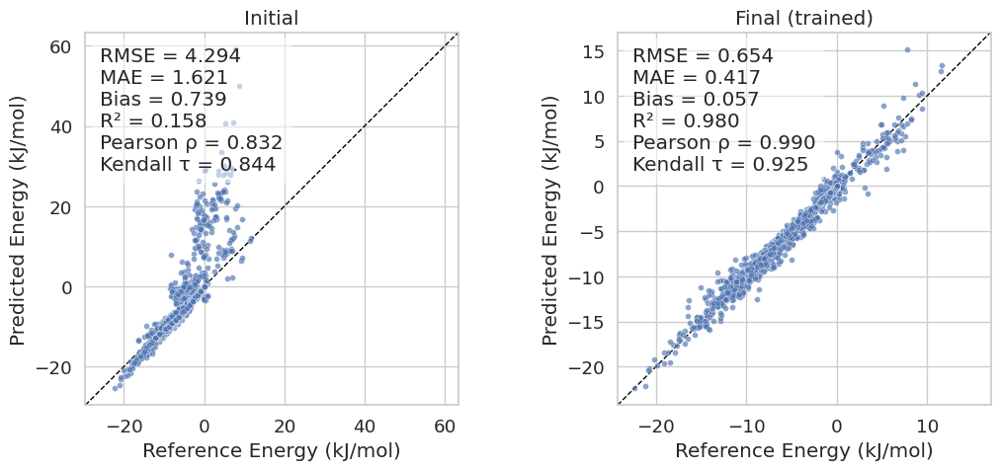

In [4]:
plot_scatter_side_by_side(
    df_initial, df_final,
    col_ref="energy_ref", col_pred="energy_pred",
    xlabel="Reference Energy (kJ/mol)",
    ylabel="Predicted Energy (kJ/mol)",
    title_a="Initial",
    title_b="Final (trained)",
)

## Per-Mixture Energy vs Scale Factor

Each subplot shows the energy as a function of scale factor for a single mixture, with curves for: reference, initial, and final (trained).

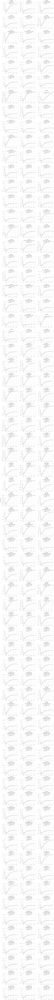

In [5]:
mixture_ids = df_final["id"].unique()
n_mixtures = len(mixture_ids)
ncols = 3
nrows = int(np.ceil(n_mixtures / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4 * nrows), squeeze=False)

for idx, mix_id in enumerate(sorted(mixture_ids)):
    row, col = divmod(idx, ncols)
    ax = axes[row, col]

    for df_stage, label, color, marker in [
        (df_initial, "Initial", "#55A868", "^"),
        (df_final,   "Final",   "#DD8452", "o"),
    ]:
        sub = df_stage[df_stage["id"] == mix_id].sort_values("scale_factor")
        if sub.empty:
            continue
        rmse = np.sqrt(np.mean((sub["energy_ref"].values - sub["energy_pred"].values) ** 2))
        ax.plot(sub["scale_factor"], sub["energy_pred"], marker=marker, ms=3, lw=1,
                alpha=0.7, label=f"{label} (RMSE={rmse:.2e})", color=color)

    # Reference (same across all stages — taken from final)
    sub_ref = df_final[df_final["id"] == mix_id].sort_values("scale_factor")
    ax.plot(sub_ref["scale_factor"], sub_ref["energy_ref"], "k-", lw=1.2, alpha=0.8, label="Reference")

    comp_title = mixture_title_map.get(mix_id, "")
    ax.set_title(f"{mix_id}\n{comp_title}", loc="center")
    ax.legend(loc="upper center", fontsize=8)

# Hide unused axes
for idx in range(n_mixtures, nrows * ncols):
    row, col = divmod(idx, ncols)
    axes[row, col].set_visible(False)

#fig.supxlabel("Scale Factor", fontsize=11)
fig.supylabel("Energy (kJ/mol)", fontsize=11)
fig.tight_layout()
plt.show()

## Forces: Initial vs Final

Forces are stored as flat lists. We compute the per-conformer force RMSE and show component-wise scatter plots.

In [6]:
def unpack_forces(df):
    """Unpack flattened forces columns into (N_total_atoms, 3) arrays."""
    f_ref  = np.vstack([np.array(f).reshape(-1, 3) for f in df["forces_ref"]])
    f_pred = np.vstack([np.array(f).reshape(-1, 3) for f in df["forces_pred"]])
    return f_ref, f_pred


f_ref_initial, f_pred_initial = unpack_forces(df_initial)
f_ref_final,   f_pred_final   = unpack_forces(df_final)

print(f"Initial forces shape: {f_ref_initial.shape}")
print(f"Final   forces shape: {f_ref_final.shape}")

Initial forces shape: (17678326, 3)
Final   forces shape: (17678326, 3)


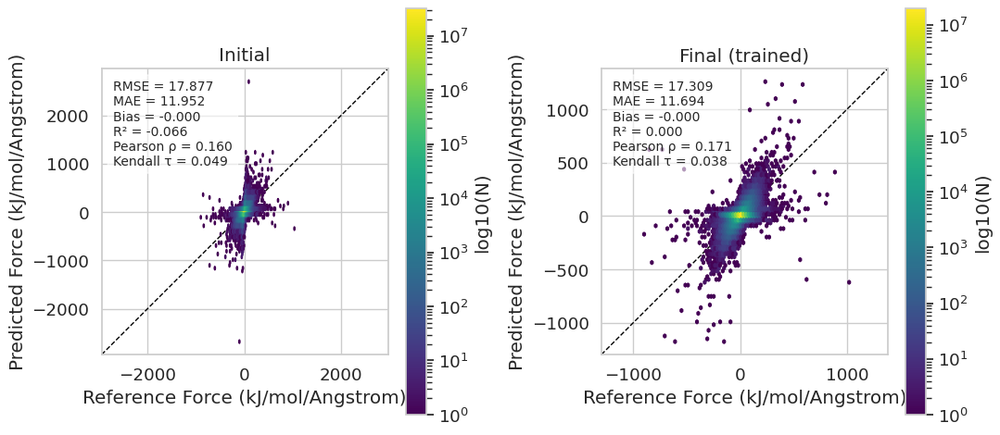

In [7]:
# Component-wise force scatter (now 2D density)
fig, axes = plt.subplots(1, 2, figsize=(11, 5))

for ax, f_ref, f_pred, title in zip(
    axes,
    [f_ref_initial.flatten(), f_ref_final.flatten()],
    [f_pred_initial.flatten(), f_pred_final.flatten()],
    ["Initial", "Final (trained)"],
):
    metrics = compute_metrics(f_ref, f_pred)

    vmin = min(f_ref.min(), f_pred.min())
    vmax = max(f_ref.max(), f_pred.max())
    pad = 0.05 * (vmax - vmin)

    # Diagonal reference line
    ax.plot(
        [vmin - pad, vmax + pad],
        [vmin - pad, vmax + pad],
        "--",
        color="black",
        lw=1,
        zorder=1,
    )

    # 2D density plot (hexbin)
    hb = ax.hexbin(
        f_ref,
        f_pred,
        gridsize=80,     # resolution (increase for finer detail)
        cmap="viridis",
        bins="log",      # log-scale counts (important for dense data)
        mincnt=1,        # ignore empty bins
        zorder=2,
    )

    # Colorbar
    cb = fig.colorbar(hb, ax=ax)
    cb.set_label("log10(N)")

    # Axes formatting
    ax.set_xlabel("Reference Force (kJ/mol/Angstrom)")
    ax.set_ylabel("Predicted Force (kJ/mol/Angstrom)")
    ax.set_xlim(vmin - pad, vmax + pad)
    ax.set_ylim(vmin - pad, vmax + pad)
    ax.set_aspect("equal")
    ax.set_title(title)

    # Metrics text box
    text = "\n".join(f"{k} = {v:.3f}" for k, v in metrics.items())
    ax.text(
        0.04,
        0.96,
        text,
        fontsize=10,
        transform=ax.transAxes,
        verticalalignment="top",
        bbox=dict(boxstyle="round,pad=0.4", facecolor="white", alpha=0.6),
    )

fig.tight_layout()
plt.show()

## Per-Mixture Atomic Forces

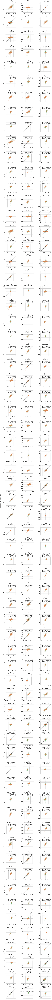

In [8]:
def unpack_forces_flat(df, mix_id, col):
    """Return all force components (N_conf * N_atoms * 3,) for a given mixture and column."""
    sub = df[df["id"] == mix_id]
    if sub.empty:
        return np.array([])
    return np.vstack([np.array(f).reshape(-1, 3) for f in sub[col]]).flatten()


mixture_ids = df_final["id"].unique()
n_mixtures = len(mixture_ids)
ncols = 3
nrows = int(np.ceil(n_mixtures / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4 * nrows), squeeze=False)

for idx, mix_id in enumerate(sorted(mixture_ids)):
    row, col = divmod(idx, ncols)
    ax = axes[row, col]

    # Reference atomic forces (same across all stages — taken from final)
    f_ref_flat = unpack_forces_flat(df_final, mix_id, "forces_ref")

    for df_stage, label, color, marker in [
        (df_initial, "Initial", "#55A868", "^"),
        (df_final,   "Final",   "#DD8452", "o"),
    ]:
        f_pred_flat = unpack_forces_flat(df_stage, mix_id, "forces_pred")
        if f_pred_flat.size == 0:
            continue
        rmse = np.sqrt(np.mean((f_ref_flat - f_pred_flat) ** 2))
        ax.scatter(f_ref_flat, f_pred_flat, marker=marker, s=4, alpha=0.2,
                   label=f"{label} (RMSE={rmse:.2e})", color=color, edgecolors="none")

    # Diagonal
    all_vals = np.concatenate([
        f_ref_flat,
        unpack_forces_flat(df_initial, mix_id, "forces_pred"),
        unpack_forces_flat(df_final, mix_id, "forces_pred"),
    ])
    vmin, vmax = all_vals.min(), all_vals.max()
    pad = 0.05 * (vmax - vmin) if vmax > vmin else 1.0
    ax.plot([vmin - pad, vmax + pad], [vmin - pad, vmax + pad], "--k", lw=0.8)
    ax.set_xlim(vmin - pad, vmax + pad)
    ax.set_ylim(vmin - pad, vmax + pad)
    ax.set_aspect("equal")

    comp_title = mixture_title_map.get(mix_id, "")
    ax.set_title(f"{mix_id}\n{comp_title}", loc="center")
    ax.legend(loc="upper center")

# Hide unused axes
for idx in range(n_mixtures, nrows * ncols):
    row, col = divmod(idx, ncols)
    axes[row, col].set_visible(False)

fig.supxlabel("Reference Atomic Force Component (kJ/mol/nm)", fontsize=11)
fig.supylabel("Predicted Atomic Force Component (kJ/mol/nm)", fontsize=11)
fig.tight_layout()
plt.show()

## Per-Conformer Force RMSE Distribution

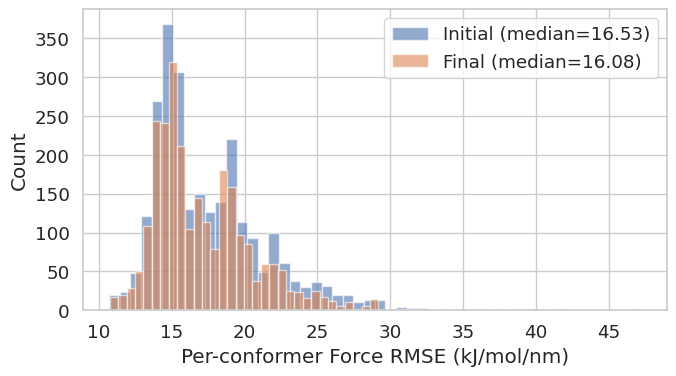

In [9]:
def per_conformer_force_rmse(df):
    """Compute per-conformer force RMSE."""
    rmses = []
    for _, row in df.iterrows():
        f_ref  = np.array(row["forces_ref"]).reshape(-1, 3)
        f_pred = np.array(row["forces_pred"]).reshape(-1, 3)
        rmses.append(np.sqrt(np.mean((f_ref - f_pred) ** 2)))
    return np.array(rmses)


rmse_initial = per_conformer_force_rmse(df_initial)
rmse_final   = per_conformer_force_rmse(df_final)

fig, ax = plt.subplots(figsize=(7, 4))
ax.hist(rmse_initial, bins=50, alpha=0.6, label=f"Initial (median={np.median(rmse_initial):.2f})")
ax.hist(rmse_final,   bins=50, alpha=0.6, label=f"Final (median={np.median(rmse_final):.2f})")
ax.set_xlabel("Per-conformer Force RMSE (kJ/mol/nm)")
ax.set_ylabel("Count")
ax.legend()
fig.tight_layout()
plt.show()

## Training Loss Curve

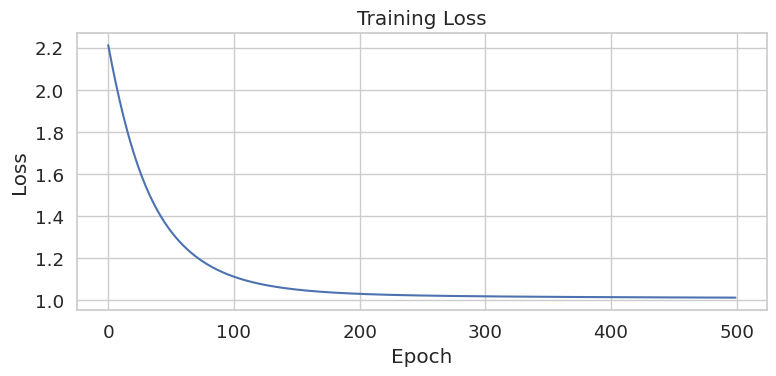

In [10]:
fig, ax = plt.subplots(figsize=(8, 4))
ax.plot(df_loss["loss"], lw=1.5)
ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")
ax.set_title("Training Loss")
fig.tight_layout()
plt.show()

## Per-Mixture Energy Error

/tmp/ipykernel_2032150/3094299784.py:3: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby("id").apply(
/tmp/ipykernel_2032150/3094299784.py:3: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby("id").apply(


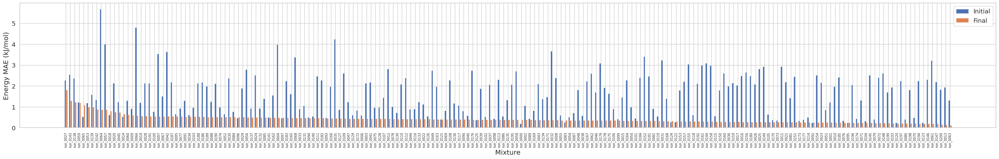

In [11]:
def per_mixture_energy_mae(df):
    """Compute per-mixture energy MAE."""
    return df.groupby("id").apply(
        lambda g: np.mean(np.abs(g["energy_ref"] - g["energy_pred"]))
    ).sort_values(ascending=False)


mae_initial = per_mixture_energy_mae(df_initial)
mae_final   = per_mixture_energy_mae(df_final)

fig, ax = plt.subplots(figsize=(30, 5))
x = np.arange(len(mae_final))
width = 0.35
ax.bar(x - width / 2, mae_initial.reindex(mae_final.index), width, label="Initial", color="#4C72B0", edgecolor="white", linewidth=0.5)
ax.bar(x + width / 2, mae_final, width, label="Final", color="#DD8452", edgecolor="white", linewidth=0.5)
ax.set_xticks(x)
ax.set_xticklabels(mae_final.index, rotation=90, fontsize=7)
ax.set_ylabel("Energy MAE (kJ/mol)")
ax.set_xlabel("Mixture")
ax.legend(frameon=True, fancybox=True, shadow=False)
fig.tight_layout()
plt.show()

## Per-Mixture Force RMSE

/tmp/ipykernel_2032150/1504273960.py:7: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby("id").apply(_rmse).sort_values(ascending=False)
/tmp/ipykernel_2032150/1504273960.py:7: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby("id").apply(_rmse).sort_values(ascending=False)


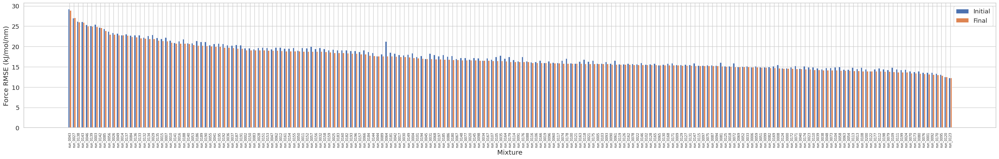

In [12]:
def per_mixture_force_rmse(df):
    """Compute per-mixture force RMSE."""
    def _rmse(g):
        f_ref  = np.vstack([np.array(f).reshape(-1, 3) for f in g["forces_ref"]])
        f_pred = np.vstack([np.array(f).reshape(-1, 3) for f in g["forces_pred"]])
        return np.sqrt(np.mean((f_ref - f_pred) ** 2))
    return df.groupby("id").apply(_rmse).sort_values(ascending=False)


frmse_initial = per_mixture_force_rmse(df_initial)
frmse_final   = per_mixture_force_rmse(df_final)

fig, ax = plt.subplots(figsize=(30, 5))
x = np.arange(len(frmse_final))
width = 0.35
ax.bar(x - width / 2, frmse_initial.reindex(frmse_final.index), width, label="Initial", color="#4C72B0", edgecolor="white", linewidth=0.5)
ax.bar(x + width / 2, frmse_final, width, label="Final", color="#DD8452", edgecolor="white", linewidth=0.5)
ax.set_xticks(x)
ax.set_xticklabels(frmse_final.index, rotation=90, fontsize=7)
ax.set_ylabel("Force RMSE (kJ/mol/nm)")
ax.set_xlabel("Mixture")
ax.legend(frameon=True, fancybox=True, shadow=False)
fig.tight_layout()
plt.show()

## Top Mixture Errors

In [13]:
print("=== Top 15 mixtures by final energy MAE ===")
print(mae_final.head(15).to_string())

print("\n=== Top 15 mixtures by final force RMSE ===")
print(frmse_final.head(15).to_string())

=== Top 15 mixtures by final energy MAE ===
id
run_0027    1.808743
run_0143    1.300005
run_0138    1.233493
run_0059    1.200412
run_0065    1.088745
run_0053    0.993553
run_0139    0.990975
run_0142    0.879507
run_0064    0.872090
run_0057    0.864497
run_0018    0.810808
run_0020    0.751089
run_0045    0.742228
run_0014    0.660064
run_0060    0.622648

=== Top 15 mixtures by final force RMSE ===
id
run_0043    28.918924
run_0027    27.076764
run_0138    26.022532
run_0143    25.922843
run_0046    25.041521
run_0139    24.951410
run_0003    24.879019
run_0142    24.589577
run_0085    23.836924
run_0056    22.993433
run_0026    22.977777
run_0049    22.845281
run_0014    22.835314
run_0137    22.740690
run_0084    22.406202


In [14]:
import sys
sys.path.insert(0, "/home/joaomorado/repos/SCALeJ/utils/summary_notebooks")

from training_summary import TrainingSummary

parquet_dict = {
    "de-force": f"{OUTPUT_DIR}/initial_evaluations.parquet",
    "Trained": f"{OUTPUT_DIR}/final_evaluations.parquet",
}

ts = TrainingSummary(
    parquet_dict,
    df="/home/joaomorado/repos/mixtures_LJ/01_preparing_simulations/output/sage-training-set.csv",
)
summary_df = ts.build_summary_df(
    forcefield_path="/scratch1/joao/joao_vol/train_experiments/output_DE_enhanced_TIP3P_nitrogen/nagl_mbis_attribute_scales_forces/train_output/trained_forcefield.offxml",  
)
ts.save_summary_html(summary_df, "training_summary.html")

Summary saved to training_summary.html
